In [1]:
# install libraries:
!pip install langdetect vaderSentiment miceforest missingpy


In [2]:
# Imports:
import pandas as pd
from langdetect import detect
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import seaborn as sns; sns.set()
import csv

## FEATURE ENGINEERING:

#### REVIEW DATA:

In [3]:
# Imports:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split
import seaborn as sns
from sklearn.model_selection import cross_val_predict
from sklearn.linear_model import LogisticRegression
import matplotlib.patches as mpatches
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import csv

In [4]:
# Reading the reviews and storing them in a dataframe
df_reviews = pd.read_csv('reviews.csv')
print(df_reviews.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243183 entries, 0 to 243182
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   listing_id     243183 non-null  int64 
 1   id             243183 non-null  int64 
 2   date           243183 non-null  object
 3   reviewer_id    243183 non-null  int64 
 4   reviewer_name  243183 non-null  object
 5   comments       243165 non-null  object
dtypes: int64(3), object(3)
memory usage: 11.1+ MB
None


In [5]:
df_clean_reviews = df_reviews.drop(["date", "reviewer_name"], axis=1)
print(df_clean_reviews.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243183 entries, 0 to 243182
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   listing_id   243183 non-null  int64 
 1   id           243183 non-null  int64 
 2   reviewer_id  243183 non-null  int64 
 3   comments     243165 non-null  object
dtypes: int64(3), object(1)
memory usage: 7.4+ MB
None


In [6]:
df_clean_reviews['comments'] = df_clean_reviews['comments'].str.lower()
print(df_clean_reviews.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243183 entries, 0 to 243182
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   listing_id   243183 non-null  int64 
 1   id           243183 non-null  int64 
 2   reviewer_id  243183 non-null  int64 
 3   comments     243165 non-null  object
dtypes: int64(3), object(1)
memory usage: 7.4+ MB
None


In [7]:
# Get language of the reviews
def get_language(x):
    try:
        return detect(x)
    except:
        return 'unknown'

df_clean_reviews['Language'] = df_clean_reviews['comments'].apply(get_language)
df_clean_reviews.head()

,listing_id,id,reviewer_id,comments,Language
0,44077,203703,393348,we enjoyed our stay very much. the room was co...,en
1,44077,211369,444004,we have been here 4 nights. stay in a home is ...,en
2,44077,234215,465058,teresa and hughie were great hosts. they were ...,en
3,44077,261843,490005,"no surprises, was as described. very gracious...",en
4,44077,268148,520460,"teresa was a lovely hostess, and we had a deli...",en


In [8]:
# Dropping the reviews which are not in english and then dropping the column 'Language'
df_clean_reviews = df_clean_reviews[df_clean_reviews["Language"] == "en"].drop(["Language"], axis=1)
df_clean_reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 208921 entries, 0 to 243182
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   listing_id   208921 non-null  int64 
 1   id           208921 non-null  int64 
 2   reviewer_id  208921 non-null  int64 
 3   comments     208921 non-null  object
dtypes: int64(3), object(1)
memory usage: 8.0+ MB


In [9]:
# saving the cleaned reviews for future use
df_clean_reviews.to_csv('clean_review.csv',index = False)

In [10]:
# Reading the cleaned reviews from csv
df_clean_reviews=pd.read_csv('clean_review.csv')
df_clean_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 208921 entries, 0 to 208920
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   listing_id   208921 non-null  int64 
 1   id           208921 non-null  int64 
 2   reviewer_id  208921 non-null  int64 
 3   comments     208921 non-null  object
dtypes: int64(3), object(1)
memory usage: 6.4+ MB


In [11]:
# Getting the comments to use for sentiment analysis
comments=df_clean_reviews['comments']
comments.head()

0    we enjoyed our stay very much. the room was co...
1    we have been here 4 nights. stay in a home is ...
2    teresa and hughie were great hosts. they were ...
3    no surprises, was as described.  very gracious...
4    teresa was a lovely hostess, and we had a deli...
Name: comments, dtype: object

In [12]:
# Get sentiment of each comment
sentiment_score=[]
sentimentAnalyzer=SentimentIntensityAnalyzer()
count=0
for comment in comments:
  sentiment_value_from_analyzer=sentimentAnalyzer.polarity_scores(comment)
  count+=1
  sentiment_score.append(sentiment_value_from_analyzer['compound'])
print(f'The total number of sentiments acquired: {count}')

The total number of sentiments acquired: 208921


In [13]:
# Storing the sentiment acquired before into the dataframe
df_clean_reviews['sentiment_score']=sentiment_score
df_clean_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 208921 entries, 0 to 208920
Data columns (total 5 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   listing_id       208921 non-null  int64  
 1   id               208921 non-null  int64  
 2   reviewer_id      208921 non-null  int64  
 3   comments         208921 non-null  object 
 4   sentiment_score  208921 non-null  float64
dtypes: float64(1), int64(3), object(1)
memory usage: 8.0+ MB


In [14]:
# saving the cleaned reviews with Sentiment for future use
df_clean_reviews.to_csv('clean_review.csv',index = False)

# Reading the cleaned reviews with Sentiment from csv
df_clean_reviews=pd.read_csv('clean_review.csv')
df_clean_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 208921 entries, 0 to 208920
Data columns (total 5 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   listing_id       208921 non-null  int64  
 1   id               208921 non-null  int64  
 2   reviewer_id      208921 non-null  int64  
 3   comments         208921 non-null  object 
 4   sentiment_score  208921 non-null  float64
dtypes: float64(1), int64(3), object(1)
memory usage: 8.0+ MB


In [15]:
# Sorting the cleaned data by listing id as it is the primary key
# The values of sentiment will be stored using vanilla python, so 
# we need the dataframe to be sorted to prevent wrong values at wrong places.
df_clean_reviews=df_clean_reviews.sort_values('listing_id')
df_clean_reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 208921 entries, 0 to 208901
Data columns (total 5 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   listing_id       208921 non-null  int64  
 1   id               208921 non-null  int64  
 2   reviewer_id      208921 non-null  int64  
 3   comments         208921 non-null  object 
 4   sentiment_score  208921 non-null  float64
dtypes: float64(1), int64(3), object(1)
memory usage: 9.6+ MB


In [16]:
# Storing the sentiment in a list to later add in the final dataframe for reviews
listing_id=df_clean_reviews.loc[:,'listing_id']
sentiment=df_clean_reviews.loc[:,'sentiment_score']

new_sentiment=[]
new_id=[]
idx=0
i=0

while(i<listing_id.size):
  count=0
  sum=0
  id=listing_id[i]
  new_id.append(id)
  while(i<listing_id.size and listing_id[i]==id):
    count+=1
    sum+=sentiment[i]
    i+=1
    print(str(id)+" count: "+str(count))
  new_sentiment.append(round((sum/count),5))
  print("ID: "+str(new_id[idx])+" SENTIMENT: "+str(new_sentiment[idx])+" SUM: "+str(sum))
  print('-----------------------------------')
  idx+=1

44077 count: 1
44077 count: 2
44077 count: 3
44077 count: 4
44077 count: 5
44077 count: 6
44077 count: 7
44077 count: 8
44077 count: 9
44077 count: 10
44077 count: 11
ID: 44077 SENTIMENT: 0.93913 SUM: 10.330400000000001
-----------------------------------
302634 count: 1
302634 count: 2
302634 count: 3
302634 count: 4
ID: 302634 SENTIMENT: 0.83588 SUM: 3.3435
-----------------------------------
44077 count: 1
44077 count: 2
44077 count: 3
44077 count: 4
44077 count: 5
44077 count: 6
44077 count: 7
44077 count: 8
44077 count: 9
44077 count: 10
44077 count: 11
44077 count: 12
44077 count: 13
44077 count: 14
44077 count: 15
44077 count: 16
44077 count: 17
44077 count: 18
44077 count: 19
44077 count: 20
44077 count: 21
44077 count: 22
44077 count: 23
44077 count: 24
44077 count: 25
44077 count: 26
44077 count: 27
44077 count: 28
44077 count: 29
44077 count: 30
ID: 44077 SENTIMENT: 0.91861 SUM: 27.5584
-----------------------------------
1797712 count: 1
ID: 1797712 SENTIMENT: 0.9916 SUM: 0

In [17]:
# Storing the comments in a list to later add in the final dataframe for reviews
listing_id=df_clean_reviews.loc[:,'listing_id']
comments=df_clean_reviews.loc[:,'comments']

new_comments=[]
temp_id=[]
idx=0
i=0

while(i<listing_id.size):
  count=0
  all_comments=""
  id=listing_id[i]
  temp_id.append(id)
  
  while(i<listing_id.size and listing_id[i]==id):
    count+=1
    all_comments+=comments[i]
    i+=1
    print(str(id)+" Count: "+str(count))
  new_comments.append(all_comments)
  print("ID: "+str(temp_id[idx])+" LENGTH: "+str(len(all_comments)))
  print('-----------------------------------')
  idx+=1

44077 Count: 1
44077 Count: 2
44077 Count: 3
44077 Count: 4
44077 Count: 5
44077 Count: 6
44077 Count: 7
44077 Count: 8
44077 Count: 9
44077 Count: 10
44077 Count: 11
ID: 44077 LENGTH: 3632
-----------------------------------
302634 Count: 1
302634 Count: 2
302634 Count: 3
302634 Count: 4
ID: 302634 LENGTH: 1550
-----------------------------------
44077 Count: 1
44077 Count: 2
44077 Count: 3
44077 Count: 4
44077 Count: 5
44077 Count: 6
44077 Count: 7
44077 Count: 8
44077 Count: 9
44077 Count: 10
44077 Count: 11
44077 Count: 12
44077 Count: 13
44077 Count: 14
44077 Count: 15
44077 Count: 16
44077 Count: 17
44077 Count: 18
44077 Count: 19
44077 Count: 20
44077 Count: 21
44077 Count: 22
44077 Count: 23
44077 Count: 24
44077 Count: 25
44077 Count: 26
44077 Count: 27
44077 Count: 28
44077 Count: 29
44077 Count: 30
ID: 44077 LENGTH: 11647
-----------------------------------
1797712 Count: 1
ID: 1797712 LENGTH: 1027
-----------------------------------
44077 Count: 1
44077 Count: 2
44077 Count

In [18]:
# Creating the final dataframe for reviews
print(len(new_sentiment),len(new_id),len(new_comments))

df_final_reviews=pd.DataFrame({'id':new_id, 'comments':new_comments, 'sentiment':new_sentiment})
df_final_reviews.shape

19680 19680 19680


(19680, 3)

In [19]:
# Storing the final dataframe for reviews to csv
df_final_reviews.to_csv('reviews_final',index=False)
df_final_reviews=pd.read_csv('reviews_final')
df_final_reviews.shape

(19680, 3)

#### LISTING DATA:

In [20]:
# Imports:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LinearRegression
from sklearn.impute import KNNImputer

In [21]:
df_listing = pd.read_csv('listings.csv')
df_listing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7566 entries, 0 to 7565
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            7566 non-null   int64  
 1   listing_url                                   7566 non-null   object 
 2   scrape_id                                     7566 non-null   int64  
 3   last_scraped                                  7566 non-null   object 
 4   source                                        7566 non-null   object 
 5   name                                          7566 non-null   object 
 6   description                                   7411 non-null   object 
 7   neighborhood_overview                         4194 non-null   object 
 8   picture_url                                   7566 non-null   object 
 9   host_id                                       7566 non-null   i

In [22]:
# Dropping useless data
df_listing = df_listing.drop(["listing_url", "scrape_id", "last_scraped", "source", "name", "picture_url", "host_id", "host_name", "host_url",
                              "host_thumbnail_url", "host_picture_url", "neighbourhood_group_cleansed", "bathrooms", "license", "host_location", "host_since", "first_review", "last_review",'neighbourhood', 'neighbourhood_cleansed',
                              'calendar_updated', 'calendar_last_scraped','minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights',
                              'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm','neighborhood_overview', 'host_about',
                              'host_response_time', 'host_acceptance_rate', 'host_neighbourhood','description'], axis=1)
df_listing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7566 entries, 0 to 7565
Data columns (total 42 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            7566 non-null   int64  
 1   description                                   7411 non-null   object 
 2   host_response_rate                            3932 non-null   object 
 3   host_is_superhost                             7566 non-null   object 
 4   host_listings_count                           7566 non-null   int64  
 5   host_total_listings_count                     7566 non-null   int64  
 6   host_verifications                            7566 non-null   object 
 7   host_has_profile_pic                          7566 non-null   object 
 8   host_identity_verified                        7566 non-null   object 
 9   latitude                                      7566 non-null   f

In [23]:
df_listing.columns.size

42

In [24]:
# Adding latitude and longitude columns to X
location=df_listing.loc[:,['id','latitude','longitude']]
df_listing=df_listing.drop(['latitude','longitude'],axis=1)
location.head()

,id,latitude,longitude
0,44077,53.29178,-6.25792
1,85156,53.29209,-6.25624
2,159889,53.39027,-6.23547
3,162809,53.28326,-6.19188
4,165828,53.33744,-6.32363


In [25]:
k_means=KMeans(n_clusters=7,init="k-means++")
# compute k-means clustering on X
k_means.fit(location[location.columns[1:3]])
location['cluster_labels']=k_means.fit_predict(location[location.columns[1:3]])
# Find the coordinates of the center of cluster
centers=k_means.cluster_centers_
labels=k_means.predict(location[location.columns[1:3]])
location.head(10)

,id,latitude,longitude,cluster_labels
0,44077,53.29178,-6.25792,0
1,85156,53.29209,-6.25624,0
2,159889,53.39027,-6.23547,0
3,162809,53.28326,-6.19188,2
4,165828,53.33744,-6.32363,5
5,165829,53.33744,-6.32363,5
6,178860,53.33281,-6.26750,5
7,181823,53.33740,-6.22061,0
8,237465,53.39558,-6.17524,6
9,245903,53.34636,-6.41734,3


c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\pandas\plotting\_matplotlib\tools.py:331: MatplotlibDeprecationWarning: 
The is_first_col function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use ax.get_subplotspec().is_first_col() instead.
  if ax.is_first_col():


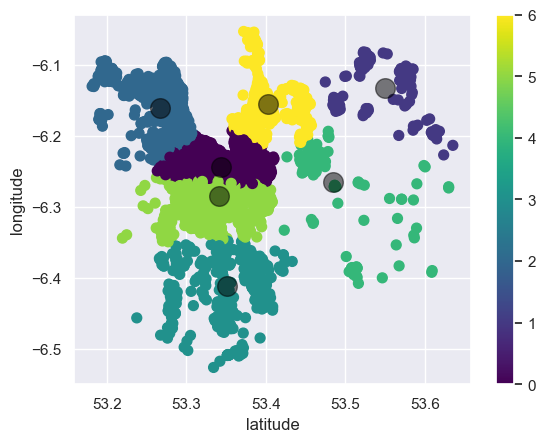

In [26]:
location.plot.scatter(x = 'latitude', y = 'longitude', c=labels, s=50, cmap='viridis')
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)

In [27]:
location=location.drop(['latitude','longitude'],axis=1)
df_listing=df_listing.merge(location,left_on='id',right_on='id')
print(df_listing.head())
print(df_listing.info())

       id                                        description  \
0   44077  Our house was built in 1937 when there was ple...   
1   85156  Our Cottage is a charming light filled cottage...   
2  159889  Washing can be done at a cost of €5  per load....   
3  162809  A nice place to relax after the bustle of the ...   
4  165828  Don't just visit Dublin, experience Dublin in ...   

  host_response_rate host_is_superhost  host_listings_count  \
0               100%                 t                    2   
1               100%                 t                    2   
2               100%                 f                    3   
3                92%                 t                    2   
4               100%                 f                    5   

   host_total_listings_count  host_verifications host_has_profile_pic  \
0                          2  ['email', 'phone']                    t   
1                          2  ['email', 'phone']                    t   
2                

In [28]:
# Making sure the host_response_rate column to have no symbols and is of type float
df_listing['host_response_rate'] = df_listing['host_response_rate'].str.replace('%', '')
df_listing['host_response_rate'] = df_listing['host_response_rate'].astype(float)

In [29]:
df_temporary=df_listing[['bedrooms','beds','host_response_rate','review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value','reviews_per_month']]

In [30]:
# To fix the mmissing values 
linear_regression = LinearRegression()
iterative_imputer = IterativeImputer(estimator=linear_regression,missing_values=np.nan, max_iter=100, verbose=2, imputation_order='roman',random_state=0)
imputed_data_iterative=iterative_imputer.fit_transform(df_temporary)
imputed_data_iterative = pd.DataFrame(imputed_data_iterative)

[IterativeImputer] Completing matrix with shape (7566, 11)
[IterativeImputer] Ending imputation round 1/100, elapsed time 0.04
[IterativeImputer] Change: 22.170216921635216, scaled tolerance: 0.1 
[IterativeImputer] Ending imputation round 2/100, elapsed time 0.07
[IterativeImputer] Change: 50.301797078360266, scaled tolerance: 0.1 
[IterativeImputer] Ending imputation round 3/100, elapsed time 0.11
[IterativeImputer] Change: 26.31195014780026, scaled tolerance: 0.1 
[IterativeImputer] Ending imputation round 4/100, elapsed time 0.14
[IterativeImputer] Change: 6.909035622160019, scaled tolerance: 0.1 
[IterativeImputer] Ending imputation round 5/100, elapsed time 0.17
[IterativeImputer] Change: 4.064876686812681, scaled tolerance: 0.1 
[IterativeImputer] Ending imputation round 6/100, elapsed time 0.21
[IterativeImputer] Change: 4.750434901965235, scaled tolerance: 0.1 
[IterativeImputer] Ending imputation round 7/100, elapsed time 0.24
[IterativeImputer] Change: 4.164663240299177, sca

In [31]:
knn_imputer = KNNImputer(n_neighbors=2)
imputed_data_knn = knn_imputer.fit_transform(df_temporary)
imputed_data_knn = pd.DataFrame(imputed_data_knn)

In [32]:
listing_data_labels = ['bedrooms','beds','host_response_rate','review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value','reviews_per_month']
i=0
for listing_data_label in listing_data_labels:
  mean_value1=round(df_temporary[listing_data_label].mean(),3)
  mean_value2=round(imputed_data_iterative[i].mean(),3)
  mean_value3=round(imputed_data_knn[i].mean(),3)
  i+=1
  print(mean_value1,mean_value2,mean_value3)

1.524 1.516 1.513
1.833 1.829 1.831
94.378 92.578 86.094
4.603 4.596 4.629
4.777 4.71 4.731
4.646 4.549 4.607
4.829 4.779 4.793
4.844 4.793 4.808
4.732 4.693 4.704
4.615 4.537 4.578
1.319 1.308 1.406


c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  
c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  """
c:\Users\Arnav\AppData\Local\Pr

<AxesSubplot:xlabel='review_scores_value', ylabel='Density'>

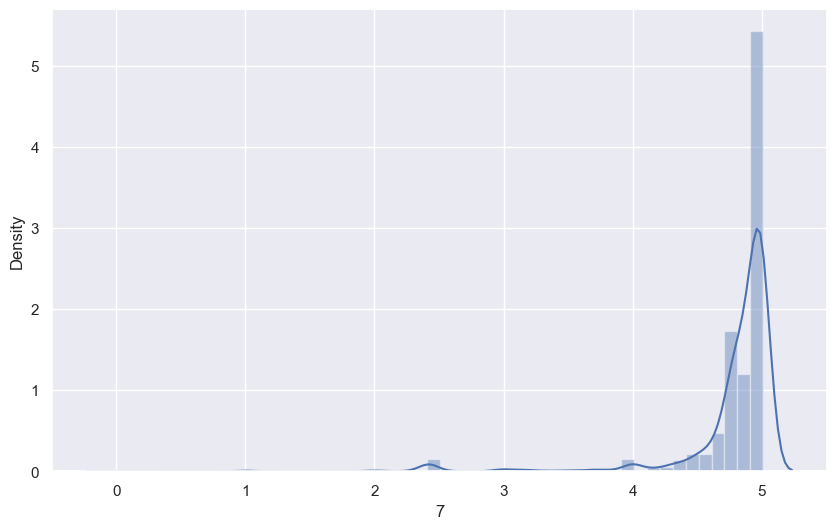

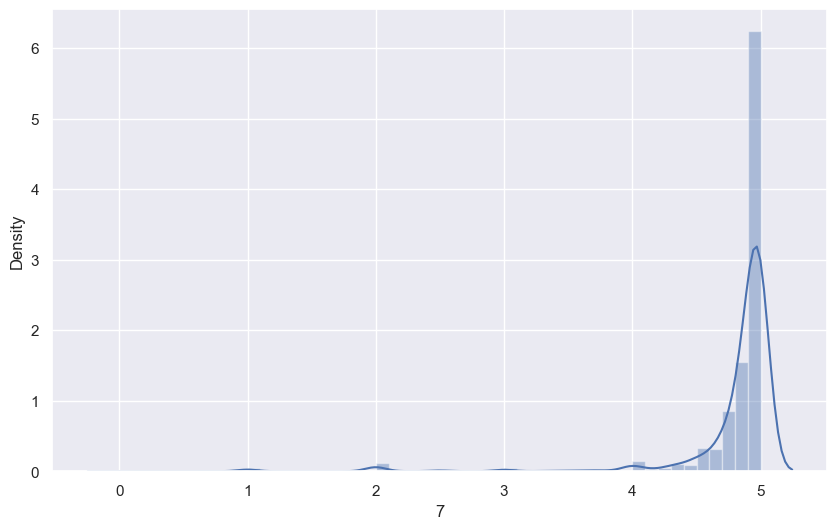

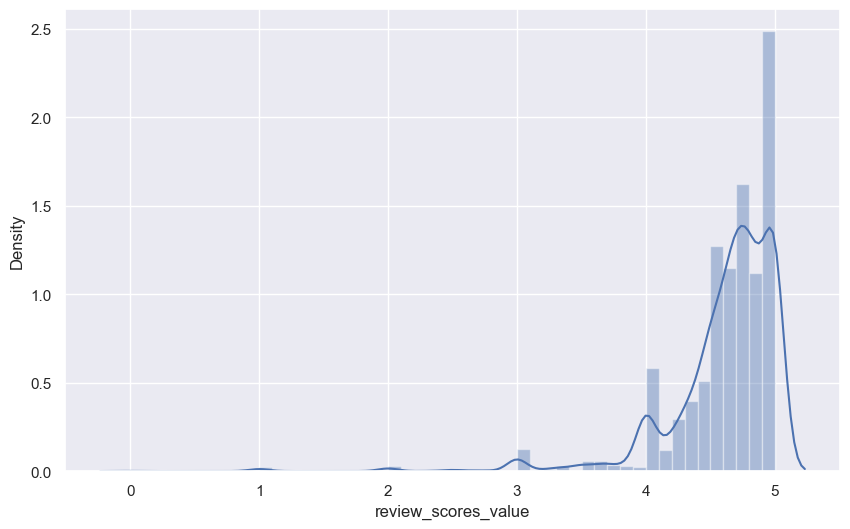

In [33]:
fig, ax = plt.subplots(figsize=(10,6))
sns.distplot(imputed_data_iterative[7])

fig, ax = plt.subplots(figsize=(10,6))
sns.distplot(imputed_data_knn[7])

fig, ax = plt.subplots(figsize=(10,6))
sns.distplot(df_temporary.review_scores_value)

In [34]:
# Store the iterative imputed data in df_temporary
i=0
for listing_data_label in listing_data_labels:
  df_temporary[listing_data_label]=imputed_data_iterative[i]
  i+=1
df_temporary

c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,bedrooms,beds,host_response_rate,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month
0,1.0,2.0,100.000000,4.780000,4.830000,4.740000,4.930000,4.930000,4.660000,4.820000,1.850000
1,1.0,1.0,100.000000,4.790000,4.860000,4.740000,4.900000,4.880000,4.640000,4.780000,1.530000
2,1.0,1.0,100.000000,4.740000,4.770000,4.710000,4.860000,4.900000,4.630000,4.740000,2.780000
3,2.0,4.0,92.000000,4.840000,4.880000,4.850000,4.950000,4.970000,4.770000,4.850000,3.680000
4,1.0,3.0,100.000000,4.630000,4.890000,4.690000,4.810000,4.750000,4.340000,4.550000,0.480000
...,...,...,...,...,...,...,...,...,...,...,...
7561,1.0,1.0,92.177445,4.583466,4.709808,4.542686,4.776509,4.788074,4.681907,4.533168,1.385634
7562,1.0,1.0,100.000000,4.863453,4.885320,4.830136,4.902114,4.925817,4.783479,4.741726,1.589863
7563,2.0,2.0,100.000000,4.868052,4.877345,4.816024,4.896711,4.922909,4.797881,4.741574,1.335869
7564,1.0,1.0,92.177445,4.583466,4.709808,4.542686,4.776509,4.788074,4.681907,4.533168,1.385634


In [35]:
# Storing df_temporary in df_listing
for listing_data_label in listing_data_labels:
  df_listing[listing_data_label]=df_temporary[listing_data_label]
df_listing.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7566 entries, 0 to 7565
Data columns (total 41 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            7566 non-null   int64  
 1   description                                   7411 non-null   object 
 2   host_response_rate                            7566 non-null   float64
 3   host_is_superhost                             7566 non-null   object 
 4   host_listings_count                           7566 non-null   int64  
 5   host_total_listings_count                     7566 non-null   int64  
 6   host_verifications                            7566 non-null   object 
 7   host_has_profile_pic                          7566 non-null   object 
 8   host_identity_verified                        7566 non-null   object 
 9   property_type                                 7566 non-null   o

In [36]:
# Converting number of bathrooms to number
bathrooms=df_listing.loc[:,['id','bathrooms_text']]
bathrooms_text_map = {'0 shared baths':1,
                      '0 baths': 1,
                      'Shared half-bath': 2,
                      'Half-bath':3,
                      'Private half-bath':4,
                      '1 shared bath':5,
                      '1 bath': 6,
                      '1 private bath': 7,
                      '1.5 baths': 9,
                      '1.5 shared baths': 8,
                      '2 shared baths':10,
                      '2 baths':11,
                      '2.5 shared baths': 12,
                      '2.5 baths': 13,
                      '3 shared baths': 14,
                      '3 baths': 15,
                      '3.5 shared baths': 16,
                      '3.5 baths': 17,
                      '4 shared baths': 18,
                      '4 baths': 19,
                      '4.5 baths': 20,
                      '5 baths': 21,
                      '5.5 baths': 22,
                      '6 shared baths': 23,
                      '6 baths': 24,
                      '6.5 baths': 25,
                      '7 baths': 26,
                      '7.5 baths': 27,
                      '8 baths': 28,
                      '8.5 baths': 29,
                      '9.5 baths': 30}

bathrooms['bathroom_map'] = bathrooms.bathrooms_text.map(bathrooms_text_map)
bathrooms.head()

,id,bathrooms_text,bathroom_map
0,44077,1.5 shared baths,8.0
1,85156,1.5 shared baths,8.0
2,159889,2 shared baths,10.0
3,162809,1.5 shared baths,8.0
4,165828,1 bath,6.0


In [37]:
df_listing = df_listing.drop(['bathrooms_text'], axis=1).merge(bathrooms, left_on='id', right_on='id')
df_listing['bathroom_map'] = df_listing['bathroom_map'].fillna(6)
df_listing = df_listing.drop(['bathrooms_text'], axis=1)
df_listing.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7566 entries, 0 to 7565
Data columns (total 41 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            7566 non-null   int64  
 1   description                                   7411 non-null   object 
 2   host_response_rate                            7566 non-null   float64
 3   host_is_superhost                             7566 non-null   object 
 4   host_listings_count                           7566 non-null   int64  
 5   host_total_listings_count                     7566 non-null   int64  
 6   host_verifications                            7566 non-null   object 
 7   host_has_profile_pic                          7566 non-null   object 
 8   host_identity_verified                        7566 non-null   object 
 9   property_type                                 7566 non-null   o

In [38]:
# Storing final listings as csv
df_listing.to_csv('final_listing.csv',index = False)
final_listing = pd.read_csv('final_listing.csv')
final_listing.shape

(7566, 41)

In [39]:
df_final_listings = pd.read_csv('final_listing.csv')

In [40]:
# Making sure all the required columns are in their correct format.
df_final_listings['price'] = df_final_listings['price'].str.replace('$', '')
df_final_listings['price'] = df_final_listings['price'].str.replace(',', '')
df_final_listings['price'] = df_final_listings['price'].astype(float)

df_final_listings['host_is_superhost'] = df_final_listings['host_is_superhost'].map({'t': 1, 'f': 0})
df_final_listings['host_has_profile_pic'] = df_final_listings['host_has_profile_pic'].map({'t': 1, 'f': 0})
df_final_listings['host_identity_verified'] = df_final_listings['host_identity_verified'].map({'t': 1, 'f': 0})
df_final_listings['has_availability'] = df_final_listings['has_availability'].map({'t': 1, 'f': 0})
df_final_listings['instant_bookable'] = df_final_listings['instant_bookable'].map({'t': 1, 'f': 0})

In [41]:
# Merging the df_final_listings and df_final_reviews
df_final = pd.merge(df_final_listings,df_final_reviews,left_on='id',right_on='id',how='left')
print(df_final.shape)
print(df_final.info())

(21152, 43)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 21152 entries, 0 to 21151
Data columns (total 43 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            21152 non-null  int64  
 1   description                                   20945 non-null  object 
 2   host_response_rate                            21152 non-null  float64
 3   host_is_superhost                             21152 non-null  int64  
 4   host_listings_count                           21152 non-null  int64  
 5   host_total_listings_count                     21152 non-null  int64  
 6   host_verifications                            21152 non-null  object 
 7   host_has_profile_pic                          21152 non-null  int64  
 8   host_identity_verified                        21152 non-null  int64  
 9   property_type                                 211

In [42]:
def number_of_items(content):
   return len(content.split(','))

def punctuation_processing(content):
    return str(content).translate(str.maketrans('', '', '!"#$%&\'()*+-./:;<=>?@[\]^_`{|}~\\'))


df_temp=df_final_listings.loc[:,['id','host_verifications']]
df_temp['host_verifications'] = df_temp['host_verifications'].apply(lambda content: punctuation_processing(content=content))
df_temp['host_verifications_count'] = df_temp['host_verifications'].apply(lambda content: number_of_items(content=content))
df_temp = df_temp.drop(['host_verifications'], axis=1)

df_final = df_final.merge(df_temp, left_on='id', right_on='id')
df_final = df_final.drop(['host_verifications'], axis=1)

df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21152 entries, 0 to 21151
Data columns (total 43 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            21152 non-null  int64  
 1   description                                   20945 non-null  object 
 2   host_response_rate                            21152 non-null  float64
 3   host_is_superhost                             21152 non-null  int64  
 4   host_listings_count                           21152 non-null  int64  
 5   host_total_listings_count                     21152 non-null  int64  
 6   host_has_profile_pic                          21152 non-null  int64  
 7   host_identity_verified                        21152 non-null  int64  
 8   property_type                                 21152 non-null  object 
 9   room_type                                     21152 non-null 

In [43]:
df_temp=df_final_listings.loc[:,['id','amenities']]
df_temp['amenities'] = df_temp['amenities'].apply(lambda content: punctuation_processing(content=content))
df_temp['amenities_count'] = df_temp['amenities'].apply(lambda content: number_of_items(content=content))
df_temp = df_temp.drop(['amenities'], axis=1)

df_final = df_final.merge(df_temp, left_on='id', right_on='id',how='left')
df_final = df_final.drop(['amenities'], axis=1)

df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21152 entries, 0 to 21151
Data columns (total 43 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            21152 non-null  int64  
 1   description                                   20945 non-null  object 
 2   host_response_rate                            21152 non-null  float64
 3   host_is_superhost                             21152 non-null  int64  
 4   host_listings_count                           21152 non-null  int64  
 5   host_total_listings_count                     21152 non-null  int64  
 6   host_has_profile_pic                          21152 non-null  int64  
 7   host_identity_verified                        21152 non-null  int64  
 8   property_type                                 21152 non-null  object 
 9   room_type                                     21152 non-null 

In [44]:
# df_final=df_final.drop(['description'],axis=1)

In [45]:
df_final['room_type'] = df_final['room_type'].map({'Shared room': 1, 'Hotel room': 2, 'Private room': 3, 'Entire home/apt': 4})
df_final = df_final.drop(['property_type'],axis=1)

In [56]:
df_final.to_csv('final_dataset.csv')

In [47]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21152 entries, 0 to 21151
Data columns (total 41 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            21152 non-null  int64  
 1   host_response_rate                            21152 non-null  float64
 2   host_is_superhost                             21152 non-null  int64  
 3   host_listings_count                           21152 non-null  int64  
 4   host_total_listings_count                     21152 non-null  int64  
 5   host_has_profile_pic                          21152 non-null  int64  
 6   host_identity_verified                        21152 non-null  int64  
 7   room_type                                     21152 non-null  int64  
 8   accommodates                                  21152 non-null  int64  
 9   bedrooms                                      21152 non-null 

## FEATURE SELECTION:

In [61]:
df_final=pd.read_csv('FinalDataset.csv')

In [62]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression

In [67]:
bestfeatures = SelectKBest(score_func=f_regression, k=10)
Y=[]
X=df_final
y_features=['review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value']
for f in y_features:
  Y.append(pd.DataFrame(df_final[f]))
  X=X.drop(f,axis=1)

topFeatures={}
for y in Y:
  print(y.columns[0])
  fit = bestfeatures.fit(X,y)
  dfscores = pd.DataFrame(fit.scores_)
  dfcolumns = pd.DataFrame(X.columns)
  #concat two dataframes for better visualization 
  featureScores = pd.concat([dfcolumns,dfscores],axis=1)
  featureScores.columns = ['Specs','Score']  #naming the dataframe columns
  labels=(featureScores.nlargest(10,'Score'))  #print 10 best features
  topFeatures[y.columns[0]]=labels['Specs'].array
  print(featureScores.nlargest(10,'Score'))
  print('-----------------------------------')

review_scores_rating
                     Specs        Score
32               sentiment  6773.682638
1       host_response_rate  6431.843258
30         amenities_count   263.548784
2        host_is_superhost   149.157935
27       reviews_per_month   120.950215
21  number_of_reviews_l30d    78.696163
19       number_of_reviews    74.882495
6   host_identity_verified    72.692301
20   number_of_reviews_ltm    44.521364
22        instant_bookable    42.940935
-----------------------------------
review_scores_accuracy
                     Specs        Score
32               sentiment  5385.757684
1       host_response_rate  3450.414756
30         amenities_count   185.463246
2        host_is_superhost   119.675834
27       reviews_per_month    94.629085
19       number_of_reviews    90.510109
21  number_of_reviews_l30d    57.937598
6   host_identity_verified    53.336071
20   number_of_reviews_ltm    37.393820
22        instant_bookable    34.057676
-----------------------------------
revi

c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-

In [64]:
topFeatures

{'review_scores_rating': <PandasArray>
 [             'sentiment',     'host_response_rate',        'amenities_count',
       'host_is_superhost',      'reviews_per_month', 'number_of_reviews_l30d',
       'number_of_reviews', 'host_identity_verified',  'number_of_reviews_ltm',
        'instant_bookable']
 Length: 10, dtype: object,
 'review_scores_accuracy': <PandasArray>
 [             'sentiment',     'host_response_rate',        'amenities_count',
       'host_is_superhost',      'reviews_per_month',      'number_of_reviews',
  'number_of_reviews_l30d', 'host_identity_verified',  'number_of_reviews_ltm',
        'instant_bookable']
 Length: 10, dtype: object,
 'review_scores_cleanliness': <PandasArray>
 [    'host_response_rate',              'sentiment',        'amenities_count',
       'host_is_superhost',      'reviews_per_month',      'number_of_reviews',
  'number_of_reviews_l30d', 'host_identity_verified',  'number_of_reviews_ltm',
     'host_listings_count']
 Length: 10, dty